In [1]:
'''Import basic modules.'''
import pandas as pd
import numpy as np

import squarify
import networkx as nx


'''Customize visualization
Seaborn and matplotlib visualization.'''
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
%matplotlib inline

'''Plotly visualization .'''
import plotly.offline as py
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go
py.init_notebook_mode(connected = True) # Required to use plotly offline in jupyter notebook

import cufflinks as cf #importing plotly and cufflinks in offline mode  
import plotly.offline  
cf.go_offline()  
cf.set_config_file(offline=False, world_readable=True)

'''Display markdown formatted output like bold, italic bold etc.'''
from IPython.display import Markdown
def bold(string):
    display(Markdown(string))

In [2]:
df = pd.read_csv('/Users/abhishekjaiswal/Downloads/Netflix_Data.csv')
df["date_added"] = pd.to_datetime(df['date_added'])
df['year_added'] = df['date_added'].dt.year
df['month_added'] = df['date_added'].dt.month

df['season_count'] = df.apply(lambda x : x['duration'].split(" ")[0] if "Season" in x['duration'] else "", axis = 1)
df['duration'] = df.apply(lambda x : x['duration'].split(" ")[0] if "Season" not in x['duration'] else "", axis = 1)
df.head(5)

,show_id,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,type,year_added,month_added,season_count
0,81193313,Chocolate,NaN,"Ha Ji-won, Yoon Kye-sang, Jang Seung-jo, Kang ...",South Korea,2019-11-30,2019,TV-14,,"International TV Shows, Korean TV Shows, Roman...",Brought together by meaningful meals in the pa...,TV Show,2019.0,11.0,1
1,81197050,Guatemala: Heart of the Mayan World,"Luis Ara, Ignacio Jaunsolo",Christian Morales,NaN,2019-11-30,2019,TV-G,67,"Documentaries, International Movies","From Sierra de las Minas to Esquipulas, explor...",Movie,2019.0,11.0,
2,81213894,The Zoya Factor,Abhishek Sharma,"Sonam Kapoor, Dulquer Salmaan, Sanjay Kapoor, ...",India,2019-11-30,2019,TV-14,135,"Comedies, Dramas, International Movies",A goofy copywriter unwittingly convinces the I...,Movie,2019.0,11.0,
3,81082007,Atlantics,Mati Diop,"Mama Sane, Amadou Mbow, Ibrahima Traore, Nicol...","France, Senegal, Belgium",2019-11-29,2019,TV-14,106,"Dramas, Independent Movies, International Movies","Arranged to marry a rich man, young Ada is cru...",Movie,2019.0,11.0,
4,80213643,Chip and Potato,NaN,"Abigail Oliver, Andrea Libman, Briana Buckmast...","Canada, United Kingdom",NaT,2019,TV-Y,,Kids' TV,"Lovable pug Chip starts kindergarten, makes ne...",TV Show,NaN,NaN,2


In [5]:
plt.rcParams['figure.figsize'] = (13, 13)
wordcloud = WordCloud(stopwords=STOPWORDS,background_color = 'black', width = 1000,  height = 1000, max_words = 121).generate(' '.join(df['title']))
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most Popular Words in Title',fontsize = 30)
plt.show()

NameError: name 'WordCloud' is not defined

In [6]:
'''A Function To Plot Pie Plot using Plotly'''

def pie_plot(cnt_srs, colors, title):
    labels=cnt_srs.index
    values=cnt_srs.values
    trace = go.Pie(labels=labels, 
                   values=values, 
                   title=title, 
                   hoverinfo='percent+value', 
                   textinfo='percent',
                   textposition='inside',
                   hole=0.7,
                   showlegend=True,
                   marker=dict(colors=colors,
                               line=dict(color='#000000',
                                         width=2),
                              )
                  )
    return trace

#bold("**NETFLIX HAVE MORE MOVIES THAN TV SHOWS**")
py.iplot([pie_plot(df['type'].value_counts(), ['cyan', 'gold'], 'Content Type')])

In [7]:
d1 = df[df["type"] == "TV Show"]
d2 = df[df["type"] == "Movie"]

col = "year_added"

vc1 = d1[col].value_counts().reset_index()
vc1 = vc1.rename(columns = {col : "count", "index" : col})
vc1['percent'] = vc1['count'].apply(lambda x : 100*x/sum(vc1['count']))
vc1 = vc1.sort_values(col)

vc2 = d2[col].value_counts().reset_index()
vc2 = vc2.rename(columns = {col : "count", "index" : col})
vc2['percent'] = vc2['count'].apply(lambda x : 100*x/sum(vc2['count']))
vc2 = vc2.sort_values(col)

trace1 = go.Scatter(
                    x=vc1[col], 
                    y=vc1["count"], 
                    name="TV Shows", 
                    marker=dict(color = 'rgb(249, 6, 6)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))

trace2 = go.Scatter(
                    x=vc2[col], 
                    y=vc2["count"], 
                    name="Movies", 
                    marker= dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(hovermode= 'closest', title = 'Content added over the years' , xaxis = dict(title = 'Year'), yaxis = dict(title = 'Count'),template= "plotly_dark")
fig = go.Figure(data = [trace1, trace2], layout=layout)
fig.show()

In [8]:
temp_df = df['rating'].value_counts().reset_index()


# create trace1
trace1 = go.Bar(
                x = temp_df['index'],
                y = temp_df['rating'],
                marker = dict(color = 'rgb(255,165,0)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(template= "plotly_dark",title = 'MOST OF PROGRAMME ON NEYFLIX IS TV-14 & TV-MA RATED' , xaxis = dict(title = 'Rating'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show()

def pie_plot(cnt_srs, title):
    labels=cnt_srs.index
    values=cnt_srs.values
    trace = go.Pie(labels=labels, 
                   values=values, 
                   title=title, 
                   hoverinfo='percent+value', 
                   textinfo='percent',
                   textposition='inside',
                   hole=0.7,
                   showlegend=True,
                   marker=dict(colors=plt.cm.viridis_r(np.linspace(0, 1, 14)),
                               line=dict(color='#000000',
                                         width=2),
                              )
                  )
    return trace

py.iplot([pie_plot(df['rating'].value_counts(), 'Content Type')])

In [9]:
df1 = df[df["type"] == "TV Show"]
df2 = df[df["type"] == "Movie"]

temp_df1 = df1['rating'].value_counts().reset_index()
temp_df2 = df2['rating'].value_counts().reset_index()


# create trace1
trace1 = go.Bar(
                x = temp_df1['index'],
                y = temp_df1['rating'],
                name="TV Shows",
                marker = dict(color = 'rgb(249, 6, 6)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))
# create trace2 
trace2 = go.Bar(
                x = temp_df2['index'],
                y = temp_df2['rating'],
                name = "Movies",
                marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))


layout = go.Layout(template= "plotly_dark",title = 'RATING BY CONTENT TYPE' , xaxis = dict(title = 'Rating'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1, trace2], layout = layout)
fig.show()

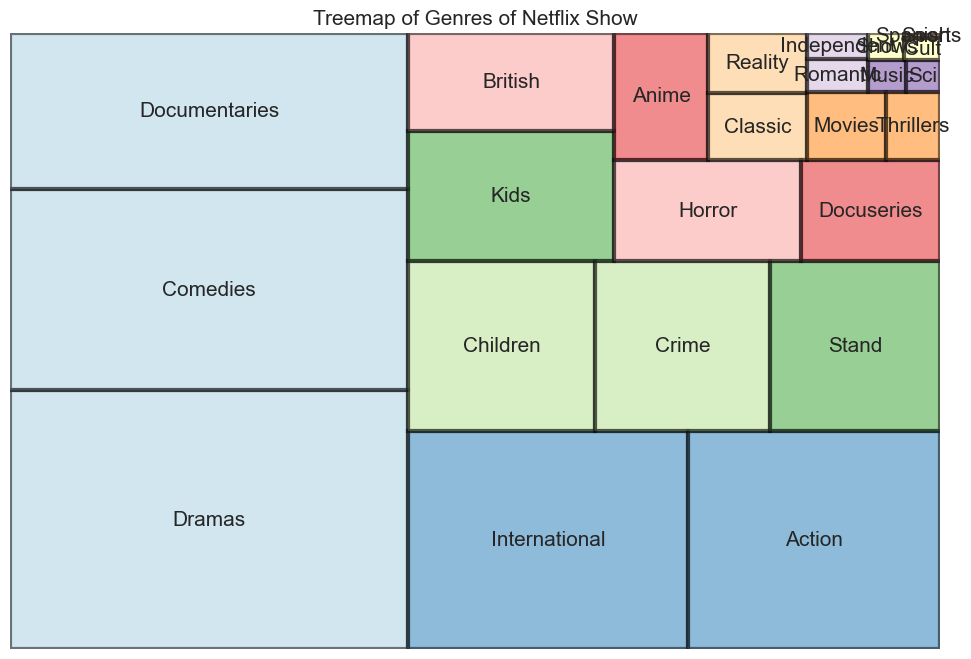

In [10]:
#bold('**MOST POPULAR GENRES ON NETFILX ARE:**')
#bold('**DOCUMENTARIES,COMEDIES, DRAMAS, INTERNATIONAL, ACTION**')
df['Genres'] = df['listed_in'].str.extract('([A-Z]\w{2,})', expand=True)
temp_df = df['Genres'].value_counts().reset_index()

sizes=np.array(temp_df['Genres'])
labels=temp_df['index']
colors = [plt.cm.Paired(i/float(len(labels))) for i in range(len(labels))]
plt.figure(figsize=(12,8), dpi= 100)
squarify.plot(sizes=sizes, label=labels, color = colors, alpha=.5, edgecolor="black", linewidth=3, text_kwargs={'fontsize':15})
plt.title('Treemap of Genres of Netflix Show', fontsize = 15)
plt.axis('off')
plt.show()

**HEATMAP(Correlation)**

/var/folders/q5/frk_2t693llgv1mykk652bnc0000gn/T/ipykernel_17945/4294720872.py:10: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



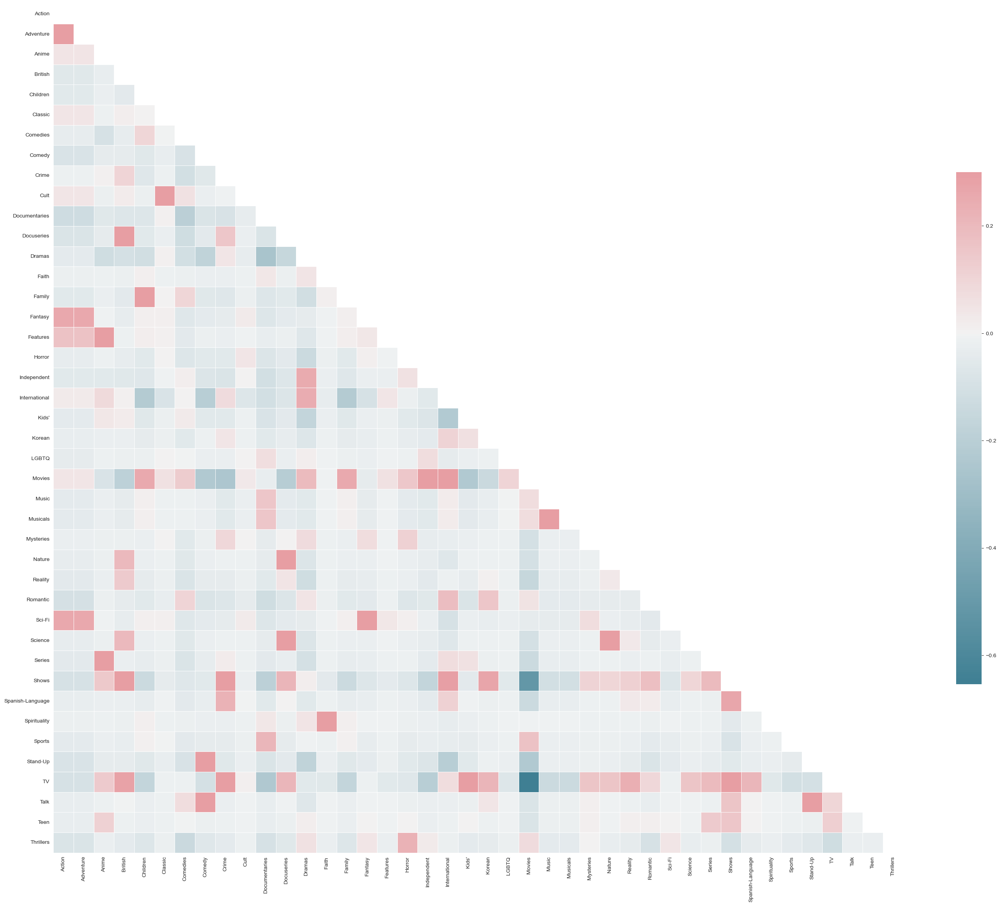

In [11]:
bold('**HEATMAP(Correlation)**')
from sklearn.preprocessing import MultiLabelBinarizer # Similar to One-Hot Encoding

data= df['listed_in'].astype(str).apply(lambda s : s.replace('&',' ').replace(',', ' ').split()) 

test = data
mlb = MultiLabelBinarizer()
res = pd.DataFrame(mlb.fit_transform(test), columns=mlb.classes_)
corr = res.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(35, 34))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

**NETWORKX (Correlation)**

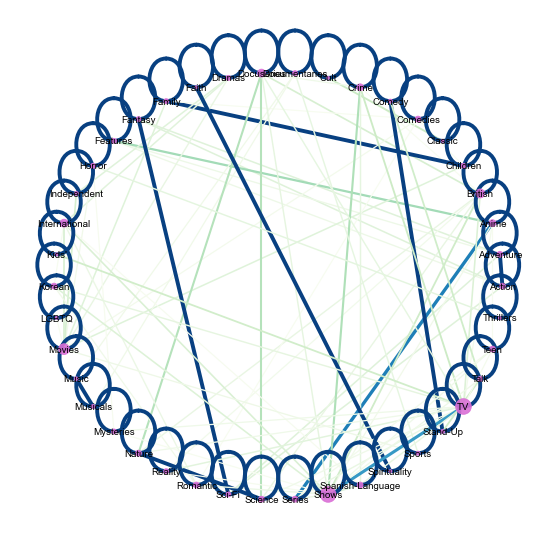

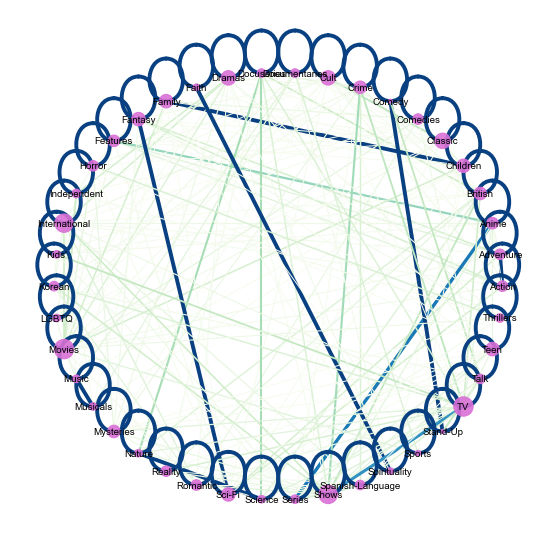

In [12]:
bold('**NETWORKX (Correlation)**')
stocks = corr.index.values
cor_matrix = np.asmatrix(corr)
G = nx.from_numpy_matrix(cor_matrix)
G = nx.relabel_nodes(G,lambda x: stocks[x])
G.edges(data=True)

def create_corr_network(G, corr_direction, min_correlation):
    H = G.copy()
    for stock1, stock2, weight in G.edges(data=True):
        if corr_direction == "positive":
            if weight["weight"] <0 or weight["weight"] < min_correlation:
                H.remove_edge(stock1, stock2)
        else:
            if weight["weight"] >=0 or weight["weight"] > min_correlation:
                H.remove_edge(stock1, stock2)
                
    edges,weights = zip(*nx.get_edge_attributes(H,'weight').items())
    weights = tuple([(1+abs(x))**2 for x in weights])
    d = nx.degree(H)
    nodelist, node_sizes = zip(*d)
    positions=nx.circular_layout(H)
    
    plt.figure(figsize=(10,10), dpi=70)
    
    nx.draw_networkx_nodes(H,positions,node_color='#DA70D6',nodelist=nodelist,
                           node_size=tuple([x**2 for x in node_sizes]),alpha=0.9)
    
    nx.draw_networkx_labels(H, positions, font_size=10, 
                            font_family='sans-serif')
    
    if corr_direction == "positive": edge_colour = plt.cm.GnBu 
    else: edge_colour = plt.cm.PuRd
        
    nx.draw_networkx_edges(H, positions, edgelist=edges,style='solid',
                          width=weights, edge_color = weights, edge_cmap = edge_colour,
                          edge_vmin = min(weights), edge_vmax=max(weights))
    plt.axis('off')
    plt.show() 
    
create_corr_network(G, 'positive', 0.1)
create_corr_network(G, 'positive', -0.1)


In [13]:
temp_df1 = df['release_year'].value_counts().reset_index()


# create trace1
trace1 = go.Bar(
                x = temp_df1['index'],
                y = temp_df1['release_year'],
                marker = dict(color = 'rgb(255,165,0)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(template= "plotly_dark",title = 'CONTENT RELEASE OVER THE YEAR' , xaxis = dict(title = 'Rating'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show()

In [14]:
df1 = df[df["type"] == "TV Show"]
df2 = df[df["type"] == "Movie"]

temp_df1 = df1['release_year'].value_counts().reset_index()
temp_df2 = df2['release_year'].value_counts().reset_index()


# create trace1
trace1 = go.Bar(
                x = temp_df1['index'],
                y = temp_df1['release_year'],
                name="TV Shows",
                marker = dict(color = 'rgb(249, 6, 6)'))
# create trace2 
trace2 = go.Bar(
                x = temp_df2['index'],
                y = temp_df2['release_year'],
                name = "Movies",
                marker = dict(color = 'rgb(26, 118, 255)'))


layout = go.Layout(template= "plotly_dark",title = 'CONTENT RELEASE OVER THE YEAR BY CONTENT TYPE' , xaxis = dict(title = 'Year'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1, trace2], layout = layout)
fig.show()

In [15]:
trace = go.Histogram(
                     x = df['duration'],
                     xbins=dict(size=0.5),
                     marker = dict(color = 'rgb(26, 118, 255)'))
layout = go.Layout(template= "plotly_dark", title = 'Distribution of Movies Duration', xaxis = dict(title = 'Minutes'))
fig = go.Figure(data = [trace], layout = layout)
fig.show()

In [16]:
import plotly.graph_objs as go
import pandas as pd

#df = pd.read_csv("movie_data.csv")
df = df.sort_values(by=['duration']) # sort values in ascending order

trace = go.Histogram(
    x=df['duration'],
    xbins=dict(size=0.5),
    marker=dict(color='rgb(26, 118, 255)')
)

layout = go.Layout(
    template="plotly_dark",
    title='Distribution of Movies Duration',
    xaxis=dict(
        title='Minutes',
        range=[0, 200],
        tickmode='linear',
        dtick=50
    ),
    yaxis=dict(
        range=[0, 50],
        tickvals=list(range(0, 51, 10))
    )
)

fig = go.Figure(data=[trace], layout=layout)
fig.show()


In [17]:
import plotly.graph_objs as go
import pandas as pd

#df = pd.read_csv("movie_data.csv")
df = df.sort_values(by=['duration']) # sort values in ascending order

trace = go.Histogram(
    x=df['duration'],
    xbins=dict(size=0.5),
    marker=dict(color='rgb(26, 118, 255)')
)

layout = go.Layout(
    template="plotly_dark",
    title='Distribution of Movies Duration',
    xaxis=dict(
        title='Minutes',
        range=[0, 200],
        tickvals=list(range(0, 201, 50))
    ),
    yaxis=dict(
        range=[0, 100],
        tickvals=list(range(0, 101, 20))
    )
)

fig = go.Figure(data=[trace], layout=layout)
fig.show()


**GREY'S ANATOMY AND NCIS HAVE HIGHEST NO. OF SEASON ON NETFLIX**

,title,director,cast,country,release_year
1109,Grey's Anatomy,NaN,"Ellen Pompeo, Sandra Oh, Katherine Heigl, Just...",United States,2018
3160,NCIS,NaN,"Mark Harmon, Michael Weatherly, Pauley Perrett...",United States,2017


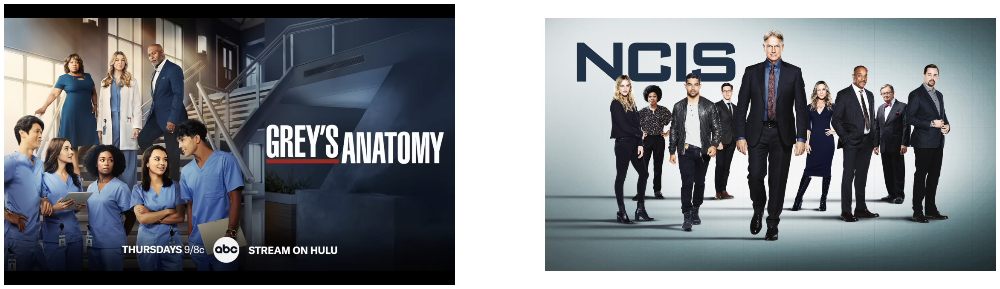

In [18]:
bold("**GREY'S ANATOMY AND NCIS HAVE HIGHEST NO. OF SEASON ON NETFLIX**")
display(df[df['season_count'] == '15'][['title','director', 'cast','country','release_year']])
"""
# image
import urllib.request
from PIL import Image

plt.subplots(figsize=(30,60))
plt.subplot(121)
image = Image.open(urllib.request.urlopen(url='https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQ0A6upRBYwNBw68tempa18gIxAliLNWkv60-X-fbgQ6rgQOGwC&s'))
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
image = Image.open(urllib.request.urlopen(url='https://i.pinimg.com/originals/58/dc/ba/58dcba558659a13a843c489fa29146f2.jpg'))
plt.imshow(image)
plt.axis('off')
plt.show()
"""
# image
import urllib.request
from PIL import Image

plt.subplots(figsize=(30,60))
plt.subplot(121)
image = Image.open(urllib.request.urlopen(url='https://cloudfront-us-east-1.images.arcpublishing.com/advancelocal/4Q36KCMHYRCJRNLNLPSLINN6KY.png'))
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
image = Image.open(urllib.request.urlopen(url='https://flxt.tmsimg.com/assets/p18964279_b_h8_aa.jpg'))
plt.imshow(image)
plt.axis('off')
plt.show()



# plot
trace = go.Histogram(
                     x = df['season_count'],
                     marker = dict(color = 'rgb(249, 6, 6)'))
layout = go.Layout(template= "plotly_dark", title = 'Seasons of TV Shows', xaxis = dict(title = 'No. of Seasons'))
fig = go.Figure(data = [trace], layout = layout)
fig.show()

In [19]:
import plotly.graph_objs as go

# Sort the season_count column in ascending order
sorted_season_count = df['season_count'].sort_values()

# Create the histogram trace with sorted x values
trace = go.Histogram(
    x=sorted_season_count,
    marker=dict(color='rgb(249, 6, 6)')
)

layout = go.Layout(
    template="plotly_dark",
    title='Seasons of TV Shows',
    xaxis=dict(title='No. of Seasons')
)

fig = go.Figure(data=[trace], layout=layout)
fig.show()


**OLDEST MOVIES ON NETFLIX**

,title,release_year,listed_in,country
4929,Prelude to War,1942,"Classic Movies, Documentaries",United States
4931,The Battle of Midway,1942,"Classic Movies, Documentaries",United States
4943,Why We Fight: The Battle of Russia,1943,Documentaries,United States
4941,Undercover: How to Operate Behind Enemy Lines,1943,"Classic Movies, Documentaries",United States
4946,WWII: Report from the Aleutians,1943,Documentaries,United States
4940,Tunisian Victory,1944,"Classic Movies, Documentaries","United States, United Kingdom"
4938,The Negro Soldier,1944,"Classic Movies, Documentaries",United States
4936,The Memphis Belle: A Story of a\nFlying Fortress,1944,"Classic Movies, Documentaries",United States
4923,Know Your Enemy - Japan,1945,"Classic Movies, Documentaries",United States
4927,Nazi Concentration Camps,1945,"Classic Movies, Documentaries",United States


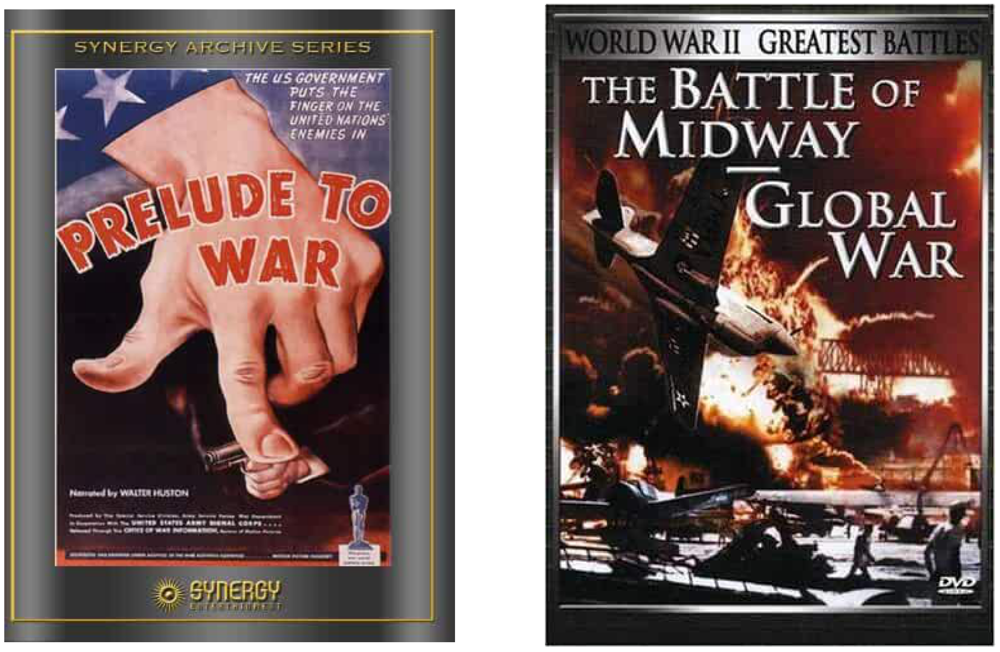

In [20]:
bold('**OLDEST MOVIES ON NETFLIX**')
oldest = df.sort_values("release_year", ascending = True)
oldest = oldest[oldest['duration'] != ""]
display(oldest[['title', "release_year", 'listed_in','country']][:10])

plt.subplots(figsize=(30,60))
plt.subplot(121)
image = Image.open(urllib.request.urlopen(url='https://m.media-amazon.com/images/M/MV5BMTY3NTMyMDQ4NF5BMl5BanBnXkFtZTgwMjkzODgwMzE@._V1_QL50_.jpg'))
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
image = Image.open(urllib.request.urlopen(url='https://m.media-amazon.com/images/M/MV5BMTY3Njg3MDUxMl5BMl5BanBnXkFtZTcwMzE4MTU1MQ@@._V1_QL50_.jpg'))
plt.imshow(image)
plt.axis('off')
plt.show()

**OLDEST TV SHOW ON NETFLIX**

,title,release_year,listed_in,country
2154,Pioneers: First Women Filmmakers*,1925,TV Shows,NaN
5143,Pioneers of African-American Cinema,1946,TV Shows,United States
4593,The Twilight Zone (Original Series),1963,"Classic & Cult TV, TV Sci-Fi & Fantasy",United States
4589,The Andy Griffith Show,1967,"Classic & Cult TV, TV Comedies",United States
4266,Star Trek,1968,"Classic & Cult TV, TV Action & Adventure, TV S...",United States
2623,Monty Python's Fliegender Zirkus,1972,"International TV Shows, TV Comedies","United Kingdom, West Germany"
2624,Monty Python's Flying Circus,1974,"British TV Shows, Classic & Cult TV, Internati...",United Kingdom
3503,Dad's Army,1977,"British TV Shows, Classic & Cult TV, TV Comedies",United Kingdom
3921,El Chavo,1979,"Classic & Cult TV, Kids' TV, Spanish-Language ...",Mexico
2182,Ninja Hattori,1981,"Anime Series, Kids' TV",Japan


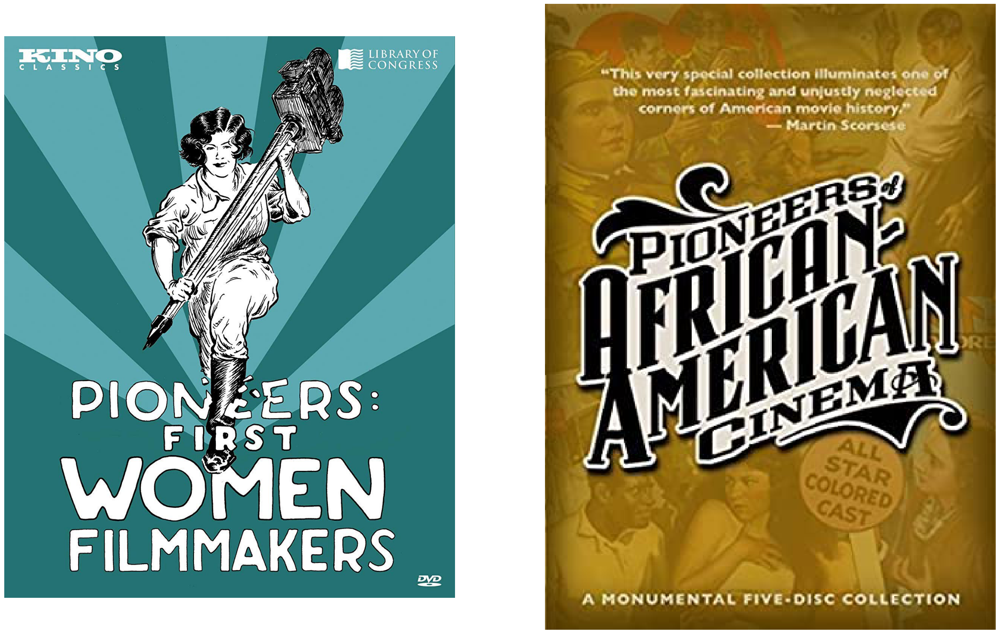

In [21]:
bold('**OLDEST TV SHOW ON NETFLIX**')
oldest = df.sort_values("release_year", ascending = True)
oldest = oldest[oldest['season_count'] != ""]
display(oldest[['title', "release_year", 'listed_in','country']][:10])

plt.subplots(figsize=(30,60))
plt.subplot(121)
image = Image.open(urllib.request.urlopen(url='https://images-na.ssl-images-amazon.com/images/I/71ddmI5x94L._SL1500_.jpg'))
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
image = Image.open(urllib.request.urlopen(url='https://images-na.ssl-images-amazon.com/images/I/51KqZA%2B42OL._SY445_.jpg'))
plt.imshow(image)
plt.axis('off')
plt.show()

In [22]:
temp_df = df['country'].value_counts().reset_index()[:20]


# create trace1
trace1 = go.Bar(
                x = temp_df['index'],
                y = temp_df['country'],
                marker = dict(color = 'rgb(153,255,153)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(template= "plotly_dark",title = 'TOP 20 COUNTIES WITH MOST CONTENT' , xaxis = dict(title = 'Countries'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show()

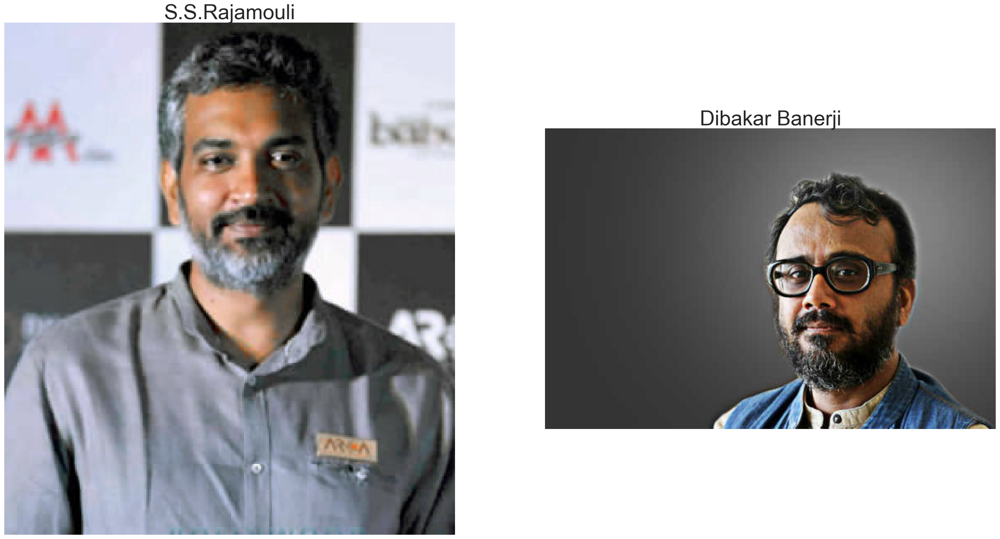

In [23]:
from collections import Counter

temp_df = df[df['type']=='Movie']
temp_df = temp_df[temp_df['country']=='India']

categories = ", ".join(temp_df['director'].fillna("")).split(", ")
counter_list = Counter(categories).most_common(11)
counter_list = [_ for _ in counter_list if _[0] != ""]
labels = [_[0] for _ in counter_list][::-1]
values = [_[1] for _ in counter_list][::-1]
trace1 = go.Bar(
                x = labels,
                y = values,
                marker = dict(color = 'rgb(51,255,255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(template= "plotly_dark",title = 'TOP 10 MOVIES DIRECTORS FROM INDIA WITH MOST CONTENT' , xaxis = dict(title = 'Directors'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show()

plt.subplots(figsize=(30,60))
plt.subplot(121)
image = Image.open(urllib.request.urlopen(url='https://upload.wikimedia.org/wikipedia/commons/7/7f/S._S._Rajamouli_at_the_trailer_launch_of_Baahubali.jpg'))
plt.title('S.S.Rajamouli', fontsize=35)
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
image = Image.open(urllib.request.urlopen(url='https://i2.cinestaan.com/image-bank/640-360/45001-46000/45877.jpg'))
plt.title('Dibakar Banerji', fontsize=35)
plt.imshow(image)
plt.axis('off')
plt.show()

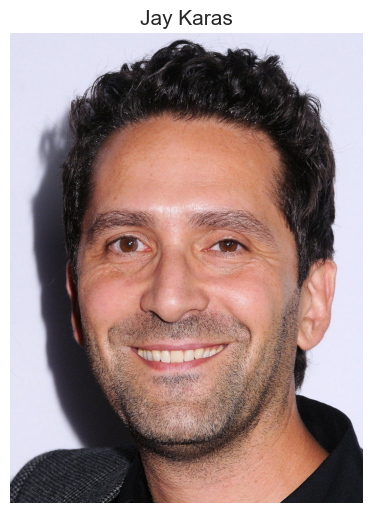

In [24]:
temp_df = df[df['type']=='Movie']
temp_df = temp_df[temp_df['country']=='United States']

categories = ", ".join(temp_df['director'].fillna("")).split(", ")
counter_list = Counter(categories).most_common(11)
counter_list = [_ for _ in counter_list if _[0] != ""]
labels = [_[0] for _ in counter_list][::-1]
values = [_[1] for _ in counter_list][::-1]
trace1 = go.Bar(
                x = labels,
                y = values,
                marker = dict(color = 'rgb(255,51,153)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(template= "plotly_dark",title = 'TOP 10 MOVIES DIRECTORS FROM U.S. WITH MOST CONTENT' , xaxis = dict(title = 'Directors'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show()

plt.subplots(figsize=(10,20))
plt.subplot(121)
image = Image.open(urllib.request.urlopen(url='http://www.gstatic.com/tv/thumb/persons/530202/530202_v9_ba.jpg'))
plt.title('Jay Karas', fontsize=15)
plt.imshow(image)
plt.axis('off')
plt.show()

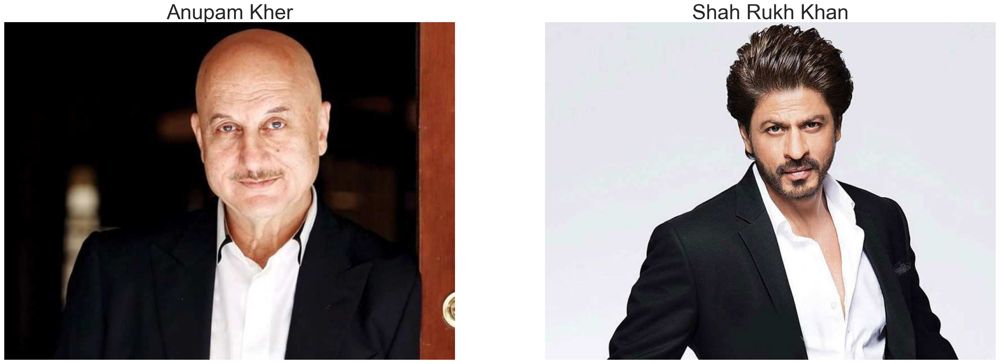

In [25]:
temp_df = df[df['type']=='Movie']
temp_df = temp_df[temp_df['country']=='India']

categories = ", ".join(temp_df['cast'].fillna("")).split(", ")
counter_list = Counter(categories).most_common(11)
counter_list = [_ for _ in counter_list if _[0] != ""]
labels = [_[0] for _ in counter_list][::-1]
values = [_[1] for _ in counter_list][::-1]
trace1 = go.Bar(
                x = labels,
                y = values,
                marker = dict(color = 'rgb(51,255,255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(template= "plotly_dark",title = 'TOP 10 MOVIES ACTORS FROM INDIA WITH MOST CONTENT' , xaxis = dict(title = 'Actors'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show()

plt.subplots(figsize=(30,60))
plt.subplot(121)
image = Image.open(urllib.request.urlopen(url='https://timesofindia.indiatimes.com/thumb/msid-67834646,imgsize-23733,width-800,height-600,resizemode-4/67834646.jpg'))
plt.title('Anupam Kher', fontsize=35)
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
image = Image.open(urllib.request.urlopen(url='https://timesofindia.indiatimes.com/thumb/msid-69340156,width-800,height-600,resizemode-4/69340156.jpg'))
plt.title('Shah Rukh Khan', fontsize=35)
plt.imshow(image)
plt.axis('off')
plt.show()

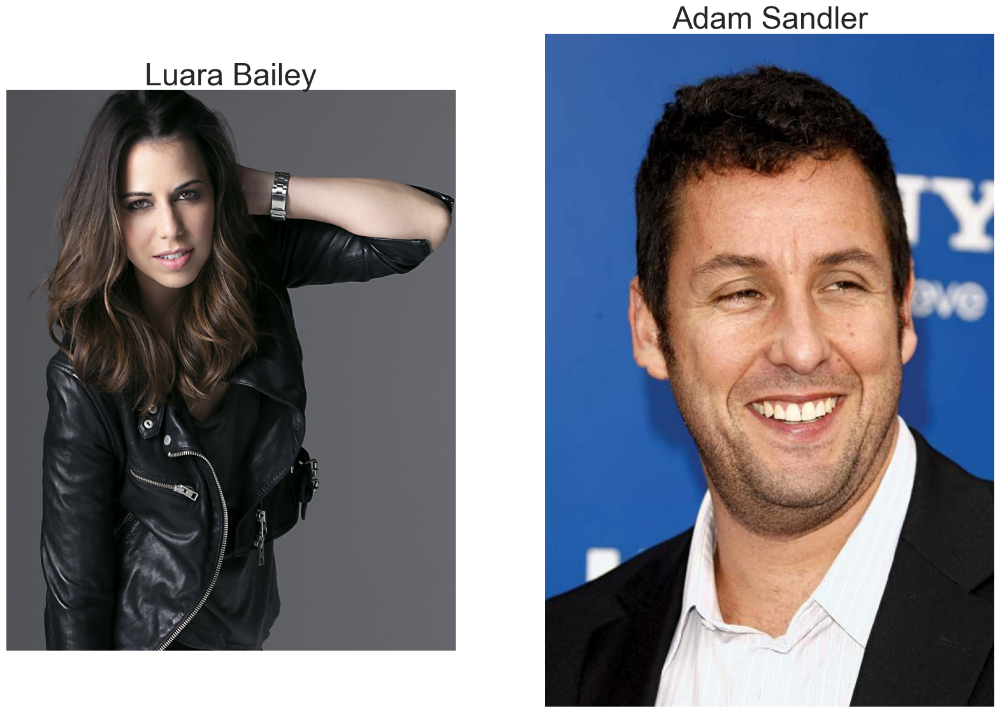

In [26]:
temp_df = df[df['type']=='Movie']
temp_df = temp_df[temp_df['country']=='United States']

categories = ", ".join(temp_df['cast'].fillna("")).split(", ")
counter_list = Counter(categories).most_common(11)
counter_list = [_ for _ in counter_list if _[0] != ""]
labels = [_[0] for _ in counter_list][::-1]
values = [_[1] for _ in counter_list][::-1]
trace1 = go.Bar(
                x = labels,
                y = values,
                marker = dict(color = 'rgb(255,51,153)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(template= "plotly_dark",title = 'TOP 10 MOVIES ACTORS FROM U.S. WITH MOST CONTENT' , xaxis = dict(title = 'Actors'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1], layout = layout)
fig.show()

plt.subplots(figsize=(20,40))
plt.subplot(121)
image = Image.open(urllib.request.urlopen(url='https://m.media-amazon.com/images/M/MV5BNTg0YTkxNGEtNjM2YS00NzYwLWIwMDktYmMzMzE0NTRiZDQwXkEyXkFqcGdeQXVyMjQwMDg0Ng@@._V1_.jpg'))
plt.title('Luara Bailey', fontsize=35)
plt.imshow(image)
plt.axis('off')

plt.subplot(122)
image = Image.open(urllib.request.urlopen(url='https://cdn.britannica.com/24/157824-050-D8E9E191/Adam-Sandler-2011.jpg'))
plt.title('Adam Sandler', fontsize=35)
plt.imshow(image)
plt.axis('off')
plt.show()

In [27]:
temp_df1 = df[df['type']=='TV Show']
temp_df1 = temp_df1[temp_df1['country']=='United States']
categories1 = ", ".join(temp_df1['director'].fillna("")).split(", ")
counter_list1 = Counter(categories1).most_common(11)
counter_list1 = [_ for _ in counter_list1 if _[0] != ""]
labels1 = [_[0] for _ in counter_list1][::-1]
values1 = [_[1] for _ in counter_list1][::-1]

temp_df2 = df[df['type']=='TV Show']
temp_df2 = temp_df2[temp_df2['country']=='India']
categories2 = ", ".join(temp_df2['director'].fillna("")).split(", ")
counter_list2 = Counter(categories2).most_common(11)
counter_list2 = [_ for _ in counter_list2 if _[0] != ""]
labels2 = [_[0] for _ in counter_list2][::-1]
values2 = [_[1] for _ in counter_list2][::-1]

from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2,subplot_titles=("United States", "India"))

trace1 = go.Bar(
                x = labels1,
                y = values1,
                marker = dict(color = 'rgb(255,51,153)',
                              line=dict(color='rgb(0,0,0)',width=1.5))
               )

trace2 = go.Bar(
                x = labels2,
                y = values2,
                marker = dict(color = 'rgb(51,255,255)',
                              line=dict(color='rgb(0,0,0)',width=1.5))
               
                )

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.update_layout(height=600, width=600,template= "plotly_dark",title_text = 'TOP 10 TV SHOW DIRECTORS MOST CONTENT')
fig.show()

In [28]:
temp_df1 = df[df['type']=='TV Show']
temp_df1 = temp_df1[temp_df1['country']=='United States']
categories1 = ", ".join(temp_df1['cast'].fillna("")).split(", ")
counter_list1 = Counter(categories1).most_common(11)
counter_list1 = [_ for _ in counter_list1 if _[0] != ""]
labels1 = [_[0] for _ in counter_list1][::-1]
values1 = [_[1] for _ in counter_list1][::-1]

temp_df2 = df[df['type']=='TV Show']
temp_df2 = temp_df2[temp_df2['country']=='India']
categories2 = ", ".join(temp_df2['cast'].fillna("")).split(", ")
counter_list2 = Counter(categories2).most_common(11)
counter_list2 = [_ for _ in counter_list2 if _[0] != ""]
labels2 = [_[0] for _ in counter_list2][::-1]
values2 = [_[1] for _ in counter_list2][::-1]

from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2,subplot_titles=("United States", "India"))

trace1 = go.Bar(
                x = labels1,
                y = values1,
                marker = dict(color = 'rgb(255,51,153)',
                              line=dict(color='rgb(0,0,0)',width=1.5))
               )
trace2 = go.Bar(
                x = labels2,
                y = values2,
                marker = dict(color = 'rgb(51,255,255)',
                              line=dict(color='rgb(0,0,0)',width=1.5))
               
                )

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.update_layout(height=600, width=600,template= "plotly_dark",title_text = 'TOP 10 TV SHOW ACTORS MOST CONTENT')
fig.show()

In [29]:
new_df = df[['title','director','cast','listed_in','description']]
new_df.head(5)

,title,director,cast,listed_in,description
0,Chocolate,NaN,"Ha Ji-won, Yoon Kye-sang, Jang Seung-jo, Kang ...","International TV Shows, Korean TV Shows, Roman...",Brought together by meaningful meals in the pa...
633,The Spy,NaN,"Sacha Baron Cohen, Noah Emmerich, Hadar Ratzon...","International TV Shows, TV Dramas, TV Thrillers","In the 1960s, Israeli clerk-turned-secret agen..."
5643,Chelsea Does,NaN,Chelsea Handler,"Docuseries, Science & Nature TV","In a provocative documentary series, comedian ..."
4361,All About Love,NaN,"Christina Mok, River Huang, Stone Yang, April ...","International TV Shows, TV Dramas, TV Horror",Mysterious ghosts – determined to reconnect wi...
173,The Devil Next Door,NaN,NaN,"Crime TV Shows, Docuseries",A Cleveland grandfather is brought to trial in...


In [30]:
from rake_nltk import Rake
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

In [31]:
# REMOVE NaN VALUES AND EMPTY STRINGS:
new_df.dropna(inplace=True)

blanks = []  # start with an empty list

col=['title','director','cast','listed_in','description']
for i,col in new_df.iterrows():  # iterate over the DataFrame
    if type(col)==str:            # avoid NaN values
        if col.isspace():         # test 'review' for whitespace
            blanks.append(i)     # add matching index numbers to the list

new_df.drop(blanks, inplace=True)

In [32]:
# initializing the new column
new_df['Key_words'] = ""

for index, row in new_df.iterrows():
    description = row['description']
    
    # instantiating Rake, by default it uses english stopwords from NLTK
    # and discards all puntuation characters as well
    r = Rake()

    # extracting the words by passing the text
    r.extract_keywords_from_text(description)

    # getting the dictionary whith key words as keys and their scores as values
    key_words_dict_scores = r.get_word_degrees()
    
    # assigning the key words to the new column for the corresponding movie
    row['Key_words'] = list(key_words_dict_scores.keys())

# dropping the Plot column
new_df.drop(columns = ['description'], inplace = True)

In [33]:
# discarding the commas between the actors' full names and getting only the first three names
new_df['cast'] = new_df['cast'].map(lambda x: x.split(',')[:3])

# putting the genres in a list of words
new_df['listed_in'] = new_df['listed_in'].map(lambda x: x.lower().split(','))

new_df['director'] = new_df['director'].map(lambda x: x.split(' '))

# merging together first and last name for each actor and director, so it's considered as one word 
# and there is no mix up between people sharing a first name
for index, row in new_df.iterrows():
    row['cast'] = [x.lower().replace(' ','') for x in row['cast']]
    row['director'] = ''.join(row['director']).lower()

In [34]:
new_df.set_index('title', inplace = True)
new_df.head()

,director,cast,listed_in,Key_words
title,,,,
Frozen Planet,alastairfothergill,[davidattenborough],"[british tv shows, docuseries, international...","[go, journey, arctic, antarctic, visually, stu..."
Oggy and the Cockroaches,olivierjean-marie,"[donmichaelpaul, tonysampson, samvincent]","[kids' tv, tv comedies]","[wimpy, blue, cat, oggy, would, like, nothing,..."
Bright: The Music Videos,davidayer,"[bastille, machinegunkelly, beberexha]",[tv shows],"[explore, hit, songs, smith, film, bright, mus..."
The Great British Baking Show,andydevonshire,"[melgiedroyc, sueperkins, maryberry]","[british tv shows, reality tv]","[talented, batch, amateur, bakers, face, 10, w..."
Degrassi: Next Class,stefanbrogren,"[amandaarcuri, amirbageria, somabhatia]","[international tv shows, tv dramas, teen tv ...","[degrassi, next, generation, high, tech, newbi..."


In [35]:
new_df['bag_of_words'] = ''
columns = new_df.columns
for index, row in new_df.iterrows():
    words = ''
    for col in columns:
        if col != 'director':
            words = words + ' '.join(row[col])+ ' '
        else:
            words = words + row[col]+ ' '
    row['bag_of_words'] = words
    
new_df.drop(columns = [col for col in new_df.columns if col!= 'bag_of_words'], inplace = True)

In [36]:
new_df.head()


,bag_of_words
title,
Frozen Planet,alastairfothergill davidattenborough british t...
Oggy and the Cockroaches,olivierjean-marie donmichaelpaul tonysampson s...
Bright: The Music Videos,davidayer bastille machinegunkelly beberexha t...
The Great British Baking Show,andydevonshire melgiedroyc sueperkins maryberr...
Degrassi: Next Class,stefanbrogren amandaarcuri amirbageria somabha...


In [37]:
# instantiating and generating the count matrix
count = CountVectorizer()
count_matrix = count.fit_transform(new_df['bag_of_words'])

# creating a Series for the movie titles so they are associated to an ordered numerical
# list I will use later to match the indexes
indices = pd.Series(new_df.index)
indices[:5]

0                    Frozen Planet
1         Oggy and the Cockroaches
2         Bright: The Music Videos
3    The Great British Baking Show
4             Degrassi: Next Class
Name: title, dtype: object

In [38]:
# generating the cosine similarity matrix
cosine_sim = cosine_similarity(count_matrix, count_matrix)
cosine_sim

array([[1.        , 0.16357216, 0.17391304, ..., 0.        , 0.04445542,
        0.03940552],
       [0.16357216, 1.        , 0.08178608, ..., 0.        , 0.        ,
        0.        ],
       [0.17391304, 0.08178608, 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.0489116 ,
        0.17342199],
       [0.04445542, 0.        , 0.        , ..., 0.0489116 , 1.        ,
        0.16116459],
       [0.03940552, 0.        , 0.        , ..., 0.17342199, 0.16116459,
        1.        ]])

In [39]:
# function that takes in movie title as input and returns the top 10 recommended movies
def recommendations(Title, cosine_sim = cosine_sim):
    
    recommended_movies = []
    
    # gettin the index of the movie that matches the title
    idx = indices[indices == Title].index[0]

    # creating a Series with the similarity scores in descending order
    score_series = pd.Series(cosine_sim[idx]).sort_values(ascending = False)

    # getting the indexes of the 10 most similar movies
    top_10_indexes = list(score_series.iloc[1:11].index)
    
    # populating the list with the titles of the best 10 matching movies
    for i in top_10_indexes:
        recommended_movies.append(list(new_df.index)[i])
        
    return recommended_movies

In [40]:
recommendations('Rocky')


['Rocky III',
 'Rocky IV',
 'Rocky II',
 'Rocky V',
 "Logan's Run",
 'Indiana Jones and the Last Crusade',
 'Thong Dee Fun Khao',
 'Arjun: The Warrior Prince',
 'The Bleeder',
 'The Age of Shadows']

In [41]:
recommendations('War Horse')


["Schindler's List",
 'God Bless the Broken Road',
 'Planetarium',
 "The Butterfly's Dream",
 'My Honor Was Loyalty',
 'Lincoln',
 'Mr. Church',
 'Harry and Snowman',
 'The Great Raid',
 'The Good Catholic']

In [42]:
recommendations('3 Idiots')


['Moms at War',
 'PK',
 'Pahuna',
 'Amar Akbar & Tony',
 'Hazaaron Khwaishein Aisi',
 'Acapulco La vida va',
 'Kai Po Che!',
 'Barrio Universitario',
 '#Selfie 69',
 'Khushi']

In [43]:
recommendations('Bad Boys')

['Bad Boys II',
 'Kung Fu Yoga',
 'Bon Cop Bad Cop 2',
 'Merantau',
 'Men in Black II',
 'Hellboy',
 'The Do-Over',
 'Free Fire',
 'Rampage: President Down',
 'Doubles Cause Troubles']